#### Shayan Ghaledar
#### Alireza Safarkhani

 در قسمت پایین در ابتدا با گرفتن آدرس فایل میایم و سپس براساس نام فایل آن ها را لود میکنیم اسم فایلها را در فایل شماره افراد ذخیره میکنیم و خود عکس ها را در دیتا در نهایت با یک کانتر تعداد افراد را میشماریم.  براساس فایل اسم افراد مقادیر یونیک را پیدا کرده و سپس براساس آن 70 فایل اول را در نظر میگیریم و درنهایت دو ماتریس تشکیل میدهیم که برای داده های آموزشی و داده هایی که در ساخت زیر فضای پی سی ای استفاده نمیشوند میباشد. سپس میانگین را حساب کرده ایم و در بردار "ام" ذخیره کرده ایم و سپس در ماتریس "ای" همه ستون ها را از میانگین کم میکنیم و ذخیره میکنیم مراحل بعدی مراحل گفته شده برای بدست آوردن مقادیر ویژه میباشد که با تکنیک گفته شده از ماتریس با ابعاد کمتر انها را استخراج میکنیم تا محاسبات کمتری بخواهد سپس براساس مقادیر ویژه و مرتب کردن آن 10 بردار ویژه برتر را میبایم و به عنوان "آیگن فیس" ها ان ها را در بخش بعد رسم میکنیم.  


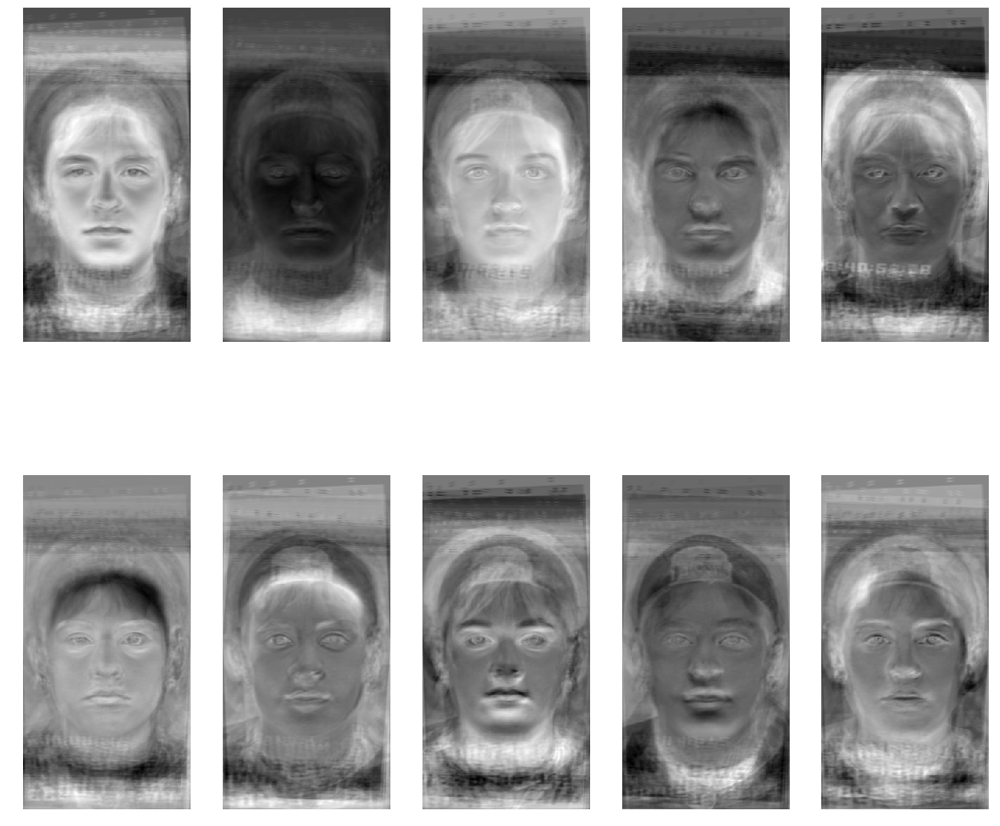

In [27]:
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.io import imread

imgnum=0
data = []
num = []
path = r"C:\Users\Goth\Documents\cvl\neutral"
for file in os.listdir(path):
    if file[-3:] in {'png'}:
        num.append(file[1:4])
        data.append(imread(path+'/'+file, as_gray=True))
        imgnum+=1

height,width = np.shape(imread(path+'/'+file, as_gray=True))
unique_person = np.unique(num)
im_matrix = np.zeros((height*width,imgnum))
choosen_persons = unique_person[0:70]
selected = np.zeros((imgnum,))
for i in range(imgnum):
    im_matrix[:,i] = np.reshape(data[i],(height*width,))
    if num[i] in choosen_persons:
        selected[i] = 1
not_selected = (selected == 0)
selected = (selected == 1)
train_img = im_matrix[:,selected]
test_img = im_matrix[:,not_selected]
m = np.mean(train_img,1)
A = np.zeros(np.shape(train_img))
for i in range(train_img.shape[1]):
    A[:,i] = train_img[:,i] - m
vals, vecs = np.linalg.eig(np.matmul(np.transpose(A),A))
vals = vals[vals.argsort()[::-1]]
vecs = vecs[:,vals.argsort()[::-1]]
vecs = vecs[:,0:10]
vecs = np.matmul(A,vecs)

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(10):
    ax[i].imshow(np.reshape(vecs[:,i]/np.linalg.norm(vecs[:,i]),(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

اگر به تصاویر دفت کنیم(جزییات رنگ مهم نیست چون میانگین را کم کرده ایم بردار هایی منفی خواهیم داشت پس باعث میشود که در اسکیلینگ رنگ متوسط خاکستری شود که مهم نمیباشد و در تولید تصاویر مشکلی ایجاد نمیکند) مشاهده میشود که جزییات مختلفی از صورت های مختلف وجود دارد مانند انواع ترکیب مو با کلاه و فرم چشم های مختلف ولی مثلا موی خیلی بلند مشاهده نمیشود پس حدس میزنیم با اینکه میتواند خروجی معقول باشد ولی دقیق نمیتواند تصاویر را با جزییات خیلی خوبی تولید کند ولی تنوع اجزای موجود میتواند بگوید که حداقل خروجی تا حد ممکن قابل قبول است

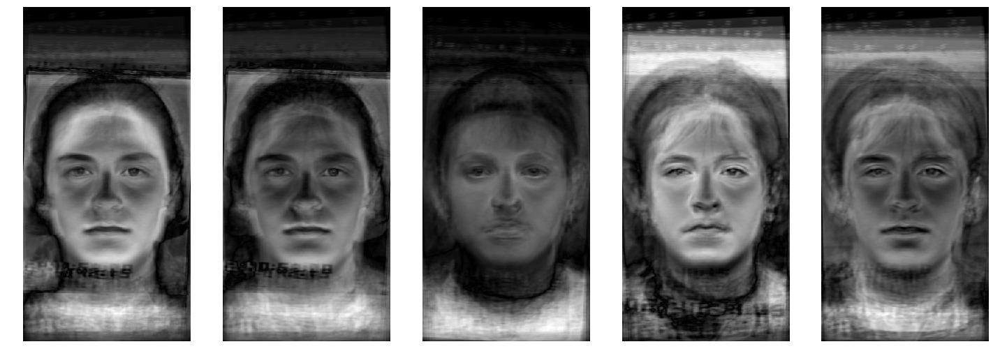

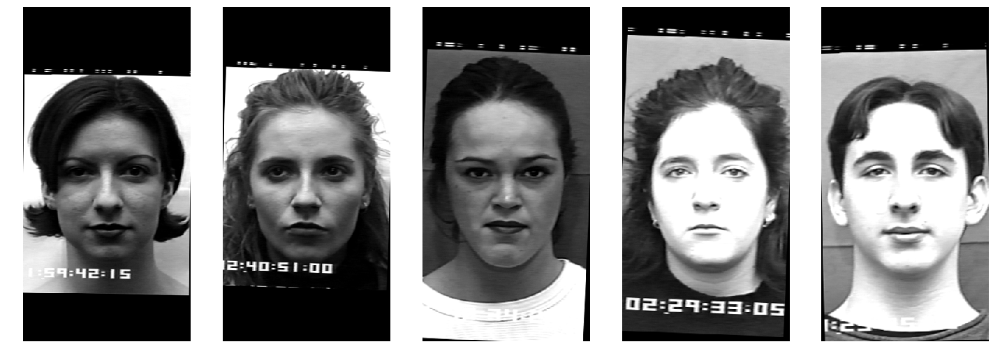

In [28]:
import matplotlib as mpl

t = A[:,0:20]
t_f = np.zeros((height*width,10))
for i in range(5):
    arr = np.matmul(np.transpose(vecs),t[:,4*i])
    arr_final = np.zeros((height*width,))
    for j in range(10):
        arr_final = arr[j]*vecs[:,j] + arr_final
    t_f[:,i] = arr_final + m
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.abs(np.reshape(t_f[:,i],(height,width))),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.reshape(train_img[:,4*i],(height,width)),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()


همانگونه که گفته شد طبق انتظار جزییات خیلی عالی نمیباشند مثلا موی تصویر دوم به خوبی تولید نمیشود که در آیگن فیس ها نیز انتظارش را داشتیم چون موی بلند در آن ها وجود نداشت و مثلا همه چشم ها به خوبی جزییات را ندارند ولی مشاهده میشود انگار در ده آیگن فیس ساخته شده به نوعی هر کدام میانگینی از فرم صورت گروه مشابه میباشد برای همین نتایج خروجی به نسبت قابل قبول و مناسب میباشند

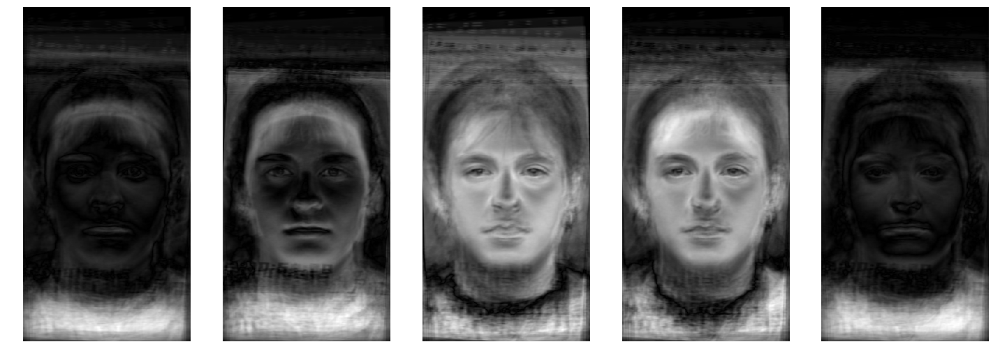

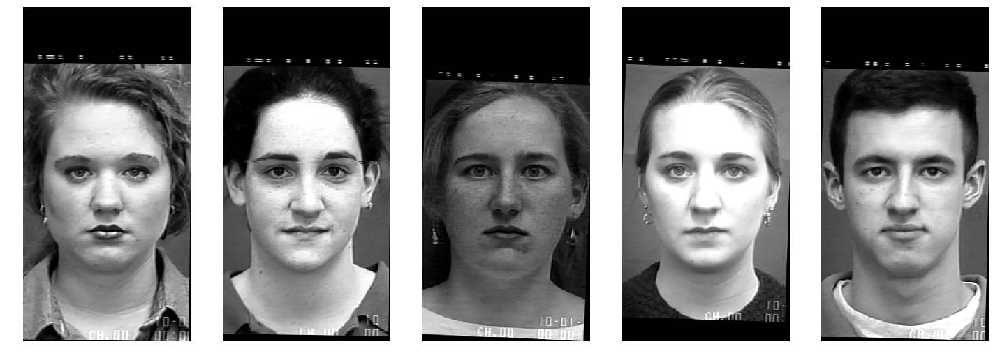

In [29]:
import matplotlib as mpl

t = np.zeros(np.shape(test_img[:,0:5]))
for i in range(5):
    t[:,i] = test_img[:,4*i] - m
t_f = np.zeros((height*width,10))
for i in range(5):
    arr = t[:,i]
    arr = np.matmul(np.transpose(vecs),arr)
    arr_final = np.zeros((height*width,))
    for j in range(10):
        arr_final = arr[j]*vecs[:,j] + arr_final
    t_f[:,i] = arr_final + m
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.abs(np.reshape(t_f[:,i],(height,width))),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.reshape(test_img[:,4*i],(height,width)),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

مشاهده میشود که با اینکه کمی شباهت بین تصاویر ساخته شده وجود دارد ولی اصلا در حد تصاویر بازسازی شده توسط داده هایی که در ساخت پایه ها بودن دقیق نمیباشد این دلیل را بعد از بازسازی با 20 پایه توضیح میدهیم
حال از 20 آگین فیس استفاده میکنیم.

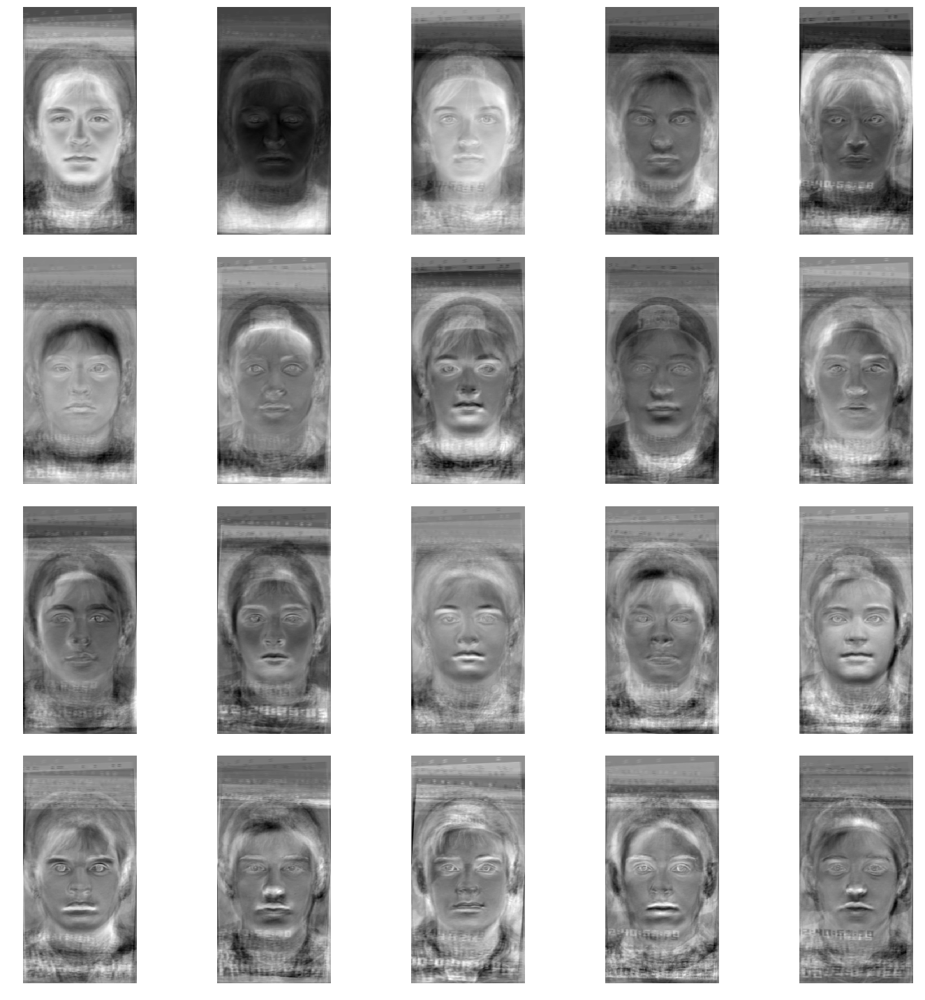

In [30]:
m = np.mean(train_img,1)
A = np.zeros(np.shape(train_img))
for i in range(train_img.shape[1]):
    A[:,i] = train_img[:,i] - m
vals, vecs = np.linalg.eig(np.matmul(np.transpose(A),A))

vals = vals[vals.argsort()[::-1] ]
vecs = vecs[:,vals.argsort()[::-1] ]
vecs = vecs[:,0:20]
vecs = np.matmul(A,vecs)
fig, axes = plt.subplots(4, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(20):
    vecs[:,i] = vecs[:,i]/np.linalg.norm(vecs[:,i])
    ax[i].imshow(np.reshape(vecs[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

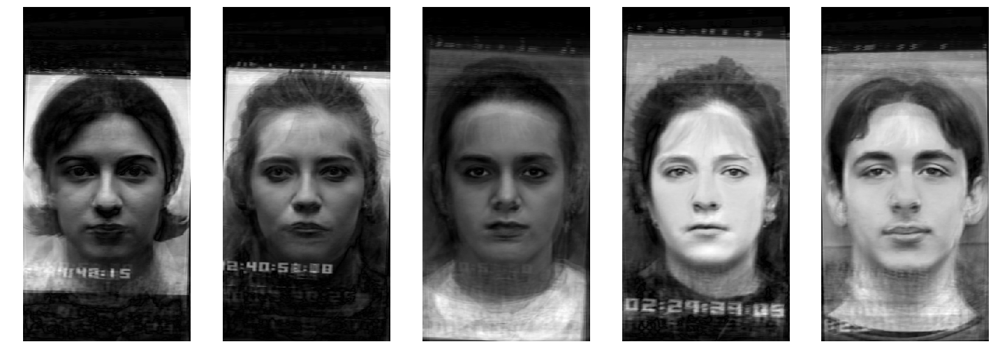

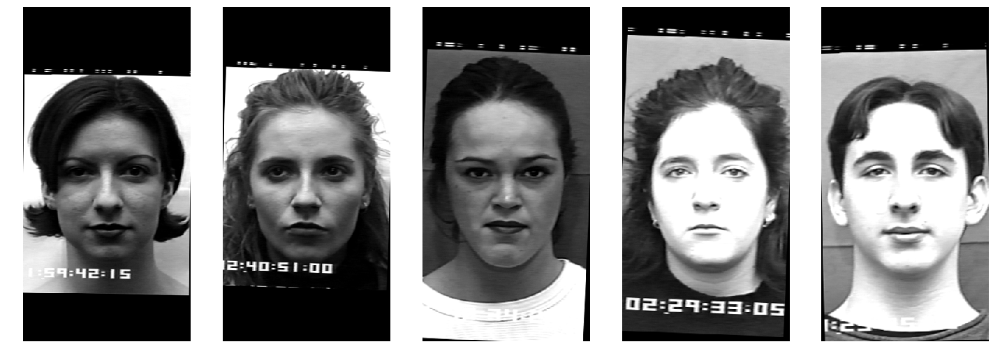

In [31]:
import matplotlib as mpl

t = A[:,0:20]
t_f = np.zeros((height*width,10))
for i in range(5):
    arr = t[:,4*i]
    arr = np.matmul(np.transpose(vecs),arr)
    arr_final = np.zeros((height*width,))
    for j in range(20):
        arr_final = arr[j]*vecs[:,j] + arr_final
    t_f[:,i] = arr_final + m
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.abs(np.reshape(t_f[:,i],(height,width))),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.reshape(train_img[:,4*i],(height,width)),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()


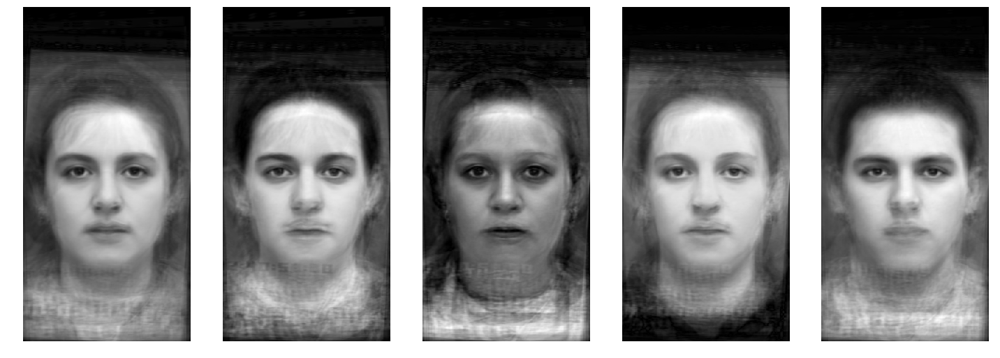

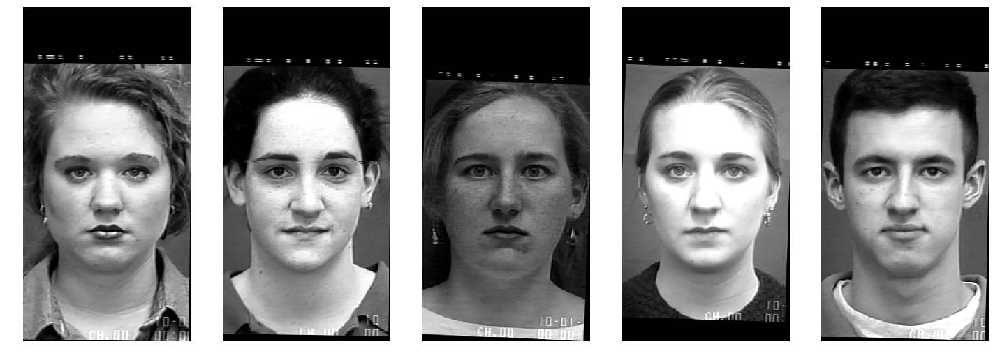

In [32]:
import matplotlib as mpl

t = np.zeros(np.shape(test_img[:,0:5]))
for i in range(5):
    t[:,i] = test_img[:,4*i] - m
t_f = np.zeros((height*width,10))
for i in range(5):
    arr = t[:,i]
    arr = np.matmul(np.transpose(vecs),arr)
    arr_final = np.zeros((height*width,))
    for j in range(20):
        arr_final = arr[j]*vecs[:,j] + arr_final
    t_f[:,i] = arr_final + m
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.abs(np.reshape(t_f[:,i],(height,width))),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()
fig, axes = plt.subplots(1, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(5):
    ax[i].imshow(np.reshape(test_img[:,4*i],(height,width)),cmap=mpl.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()


همانطور که مشاهده میشود در حالت استفاده از 20 پایه به مراتب در حالتی که با خود داده هایی که در ساخت پایه ها نقش داشته اند در تولید آن ها بهتر است و در حالت باز سازی در 
تصاویری که در ساخت پایه ها شرکت نداشته اند نیز مقداری بهتر شده است ولی نه خیلی

مقایسه اینکه چرا در دو ( اعمال برروی تصاویری که در ساخت دخیل بوده اند یا نبوده اند):
در این روش وقتی پراکندگی کلی فضای تولید شده را بررسی میکنیم میدانیم تصاویر دارای اطلاعات پایه مشابهی میباشند برای همین نیز در هر دو حالت میتوان کلیت را به خوبی تولید کرد  ولی وقتی که ما با حدود 137 تصویر ( 70 نفر اول) فضا را تولید میکنیم پایه های ساخته شده بیشتر تغییرات خود داده را در نظر میگیرند برای همین نیز فرم چشم ها موها و دماغ و بقیه موارد بیشتر به حالت میانگین حالات پرتکرار در خود عکس های استفاده شده در میاید( دقت کنید تنها در رابطه با 20 پایه برتر صحبت میکنیم جلوتر که میرویم حالت جزیی تر میگیرند) پس با اینکه کلیات شبیه به هم میباشند ولی در ساخت جزییات دقیق تر نیاز هست که خود تصاویر دخیل باشند در ساخت پایه ها یا اینکه به مراتب پایه های بیشتری استفاده شود و دیتابیس استفاده شده نیز به مراتب بزرگ تر باشد تا اینکه گستردگی کلی انواع حالات را بتوان درست کرد و گرنه همانگونه که در اینجا نیز مشاهده شد خروجی  داده های ساخته شد که در ساخت پایه ها دخیل نبوده اند فقط جزییات کلی شباهت دارد و نسبت به حالت دیگر نتایج به مراتب کم کیفیت تر میباشد

### part 3

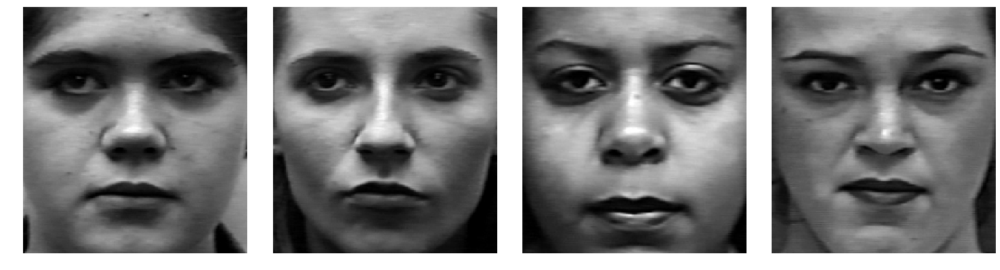

In [33]:
import matplotlib.pyplot as plt
import numpy as np
import os
from skimage.io import imread

data_n = []
num = []
path = r"C:\Users\Goth\Documents\cvl\neutral"
imgnum = 0
for file in os.listdir(path):
    if file[-3:] in {'png'}:
        num.append(file[1:4])
        im = imread(path+'/'+file, as_gray=True)
        data_n.append(im[230:450,50:250])
        imgnum = imgnum + 1

height,width = np.shape(im[230:450,50:250])
unique_person = np.unique(num)
mask = np.zeros((height,width))
for i in range(height):
    for j in range (width):
        if ((i - 340)**2)/(120**2) + ((j - 150)**2)/(100**2) < 1:
            mask[i,j] = 1

matrix_n = np.zeros((height*width,imgnum))
for i in range(imgnum):
    matrix_n[:,i] = np.reshape(data_n[i],(height*width,))
chosen_idx = [2,4,6,8]
fig, axes = plt.subplots(1, 4, figsize=(20, 20))
ax = axes.ravel()
im_imgnum = 0
for i in chosen_idx:
    ax[im_imgnum].imshow(np.reshape(matrix_n[:,i],(height,width)), cmap=plt.cm.gray)
    ax[im_imgnum].axis('off')
    im_imgnum = im_imgnum +1
fig.tight_layout()
plt.show()

همانطور که مشاهده میشود ما برای ماسک کردن حدود مربعی که به خوبی اطلاعات صورت را دارد نگه میداریم و بقیه اطلاعات را استفاده نمیکنیم

در قسمت های جلوتر صورت های مختلف را لود میکنیم

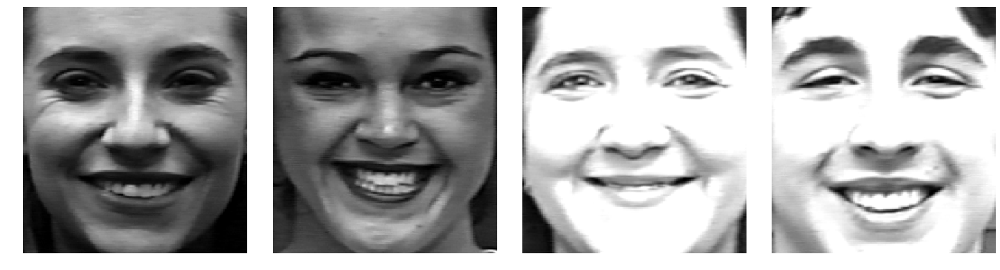

In [34]:
# for happy face
data_h = []
num = []
path = r"C:\Users\Goth\Documents\cvl\happy"
imgnum = 0
for file in os.listdir(path):
    if file[-3:] in {'png'}:
        num.append(file[1:4])
        im = imread(path+'/'+file, as_gray=True)
        data_h.append(im[230:450,50:250])
        imgnum += 1
im_matrix_h = np.zeros((height*width,imgnum))
for i in range(imgnum):
    im_matrix_h[:,i] = np.reshape(data_h[i],(height*width,))
chosen_idx = [2,4,6,8]
fig, axes = plt.subplots(1, 4, figsize=(20, 20))
ax = axes.ravel()
im_imgnum = 0
for i in chosen_idx:
    ax[im_imgnum].imshow(np.reshape(im_matrix_h[:,i],(height,width)), cmap=plt.cm.gray)
    ax[im_imgnum].axis('off')
    im_imgnum = im_imgnum +1
fig.tight_layout()
plt.show()

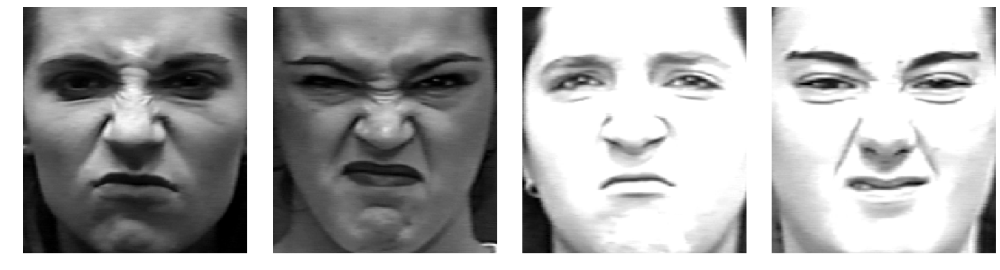

In [35]:
# for disgust face
data_d = []
num = []
path = r"C:\Users\Goth\Documents\cvl\disgust"
imgnum = 0
for file in os.listdir(path):
    if file[-3:] in {'png'}:
        num.append(file[1:4])
        im = imread(path+'/'+file, as_gray=True)
        data_d.append(im[230:450,50:250])
        imgnum += 1
im_matrix_d = np.zeros((height*width,imgnum))
for i in range(imgnum):
    im_matrix_d[:,i] = np.reshape(data_d[i],(height*width,))
chosen_idx = [2,4,6,8]
fig, axes = plt.subplots(1, 4, figsize=(20, 20))
ax = axes.ravel()
im_imgnum = 0
for i in chosen_idx:
    ax[im_imgnum].imshow(np.reshape(im_matrix_d[:,i],(height,width)), cmap=plt.cm.gray)
    ax[im_imgnum].axis('off')
    im_imgnum += 1
fig.tight_layout()
plt.show()

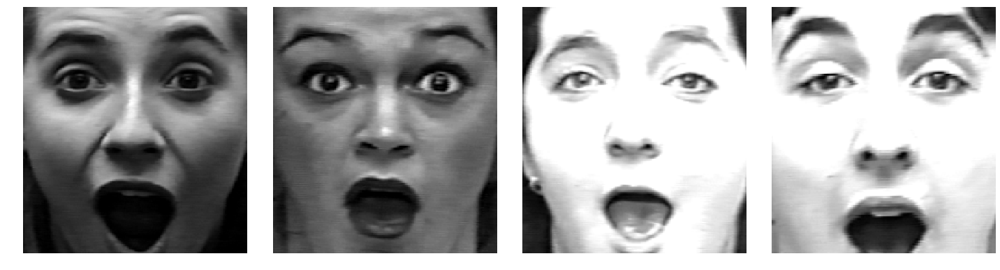

In [36]:
# for surprised image

data_s = []
num = []
path = r"C:\Users\Goth\Documents\cvl\surprise"
imgnum = 0
for file in os.listdir(path):
    if file[-3:] in {'png'}:
        num.append(file[1:4])
        im = imread(path+'/'+file, as_gray=True)
        data_s.append(im[230:450,50:250])
        imgnum += 1
im_matrix_s = np.zeros((height*width,imgnum))
for i in range(imgnum):
    im_matrix_s[:,i] = np.reshape(data_s[i],(height*width,))
chosen_idx = [2,4,6,8]
fig, axes = plt.subplots(1, 4, figsize=(20, 20))
ax = axes.ravel()
im_imgnum = 0
for i in chosen_idx:
    ax[im_imgnum].imshow(np.reshape(im_matrix_s[:,i],(height,width)), cmap=plt.cm.gray)
    ax[im_imgnum].axis('off')
    im_imgnum = im_imgnum +1
fig.tight_layout()
plt.show()

طبق الگوتریتم گفته شده میایم و آیگن فیس های مختلف را استخراج میکنیم

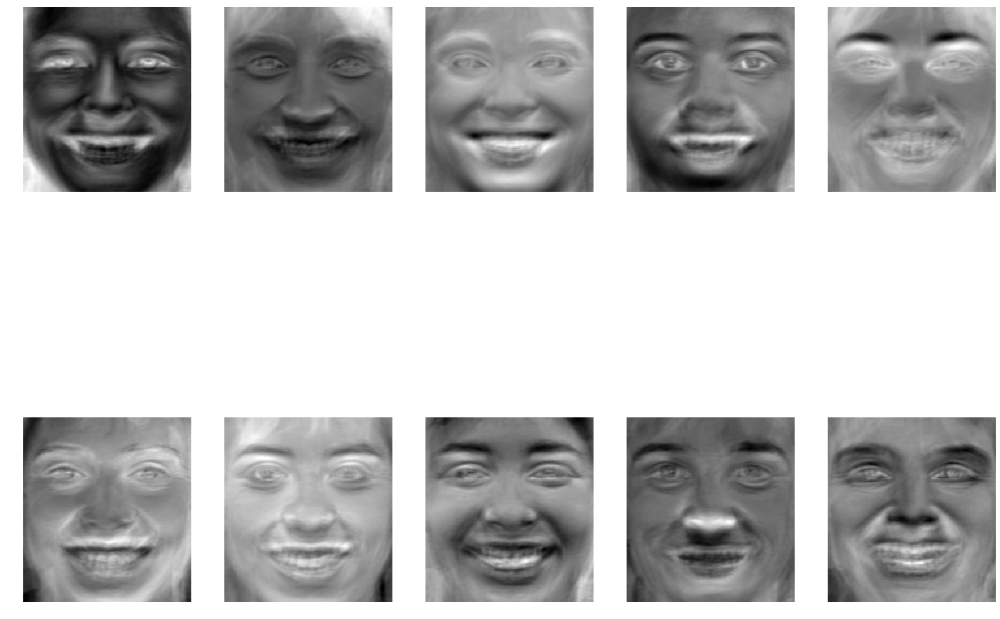

In [37]:
# creating eigen faces for happy

m_h = np.mean(im_matrix_h,1)
A_h = np.zeros(np.shape(im_matrix_h))
for i in range(im_matrix_h.shape[1]):
    A_h[:,i] = im_matrix_h[:,i] - m_h
    
    
C = np.matmul(np.transpose(A_h),A_h)
valsh, vecsh = np.linalg.eig(C)
valsh = valsh[valsh.argsort()[::-1] ]
vecsh = vecsh[:,valsh.argsort()[::-1] ]
vecsh = np.matmul(A_h,vecsh)

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(vecsh.shape[1]):
    vecsh[:,i] = vecsh[:,i]/np.linalg.norm(vecsh[:,i])
    if i < 10:
        ax[i].imshow(np.reshape(vecsh[:,i],(height,width)), cmap=plt.cm.gray)
        ax[i].axis('off')
fig.tight_layout()
plt.show()

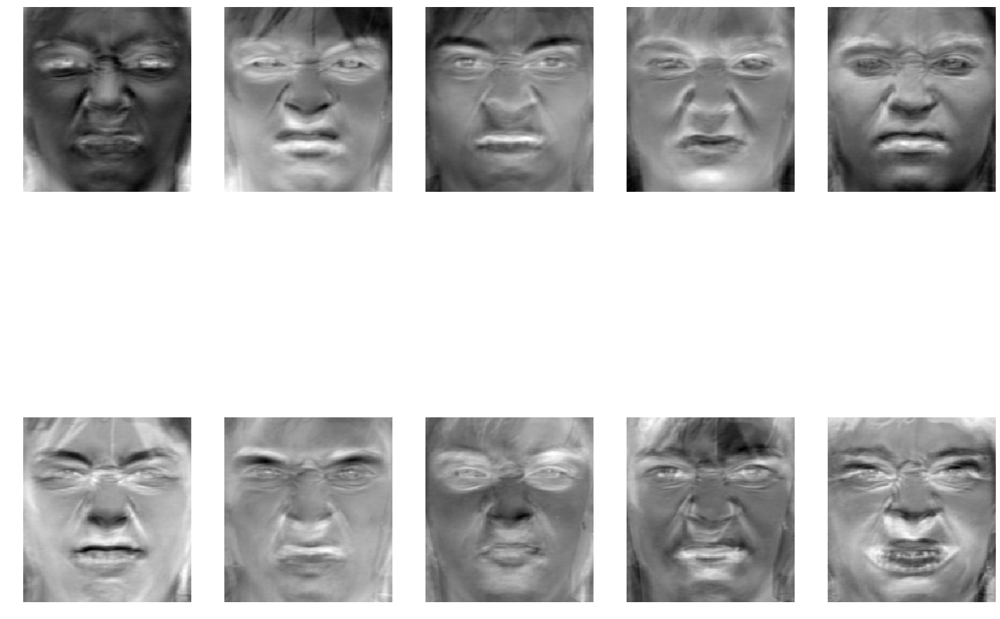

In [38]:
# creating eigen faces for disgusted
m_d = np.mean(im_matrix_d,1)
A_d = np.zeros(np.shape(im_matrix_d))
for i in range(im_matrix_d.shape[1]):
    A_d[:,i] = im_matrix_d[:,i] - m_d
C = np.matmul(np.transpose(A_d),A_d)


valsd, vecsd = np.linalg.eig(C)
valsd = valsd[valsd.argsort()[::-1]]
vecsd = np.matmul(A_d,vecsd[:,valsd.argsort()[::-1]])

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(vecsd.shape[1]):
    vecsd[:,i] = vecsd[:,i]/np.linalg.norm(vecsd[:,i])
    if i < 10:
        ax[i].imshow(np.reshape(vecsd[:,i],(height,width)), cmap=plt.cm.gray)
        ax[i].axis('off')
fig.tight_layout()
plt.show()

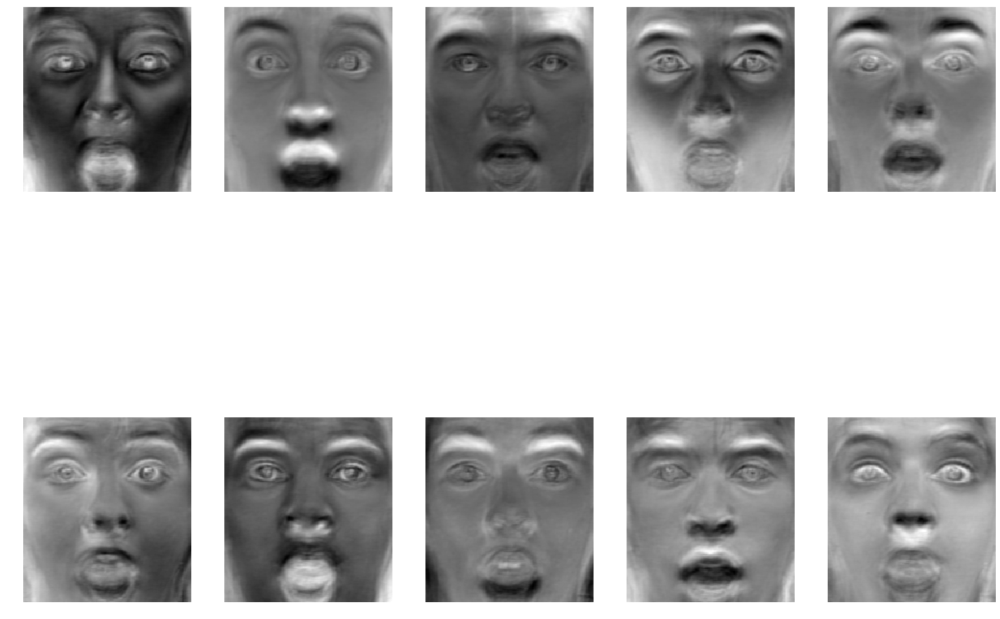

In [39]:
# creating eigen faces for surprise
m_s = np.mean(im_matrix_s,1)
A_s = np.zeros(np.shape(im_matrix_s))
for i in range(im_matrix_s.shape[1]):
    A_s[:,i] = im_matrix_s[:,i] - m_s
C = np.matmul(np.transpose(A_s),A_s)


valss, vecss = np.linalg.eig(C)
valss = valss[valss.argsort()[::-1]]
vecss = np.matmul(A_s,vecss[:,valss.argsort()[::-1]])


fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel()
for i in range(vecss.shape[1]):
    vecss[:,i] = vecss[:,i]/np.linalg.norm(vecss[:,i])
    if i < 10:
        ax[i].imshow(np.reshape(vecss[:,i],(height,width)), cmap=plt.cm.gray)
        ax[i].axis('off')
fig.tight_layout()
plt.show()

حال باید تصاویر را به صورت رندوم انتخاب کنیم این کار را با شافل کردن شماره افراد انجام میدهیم

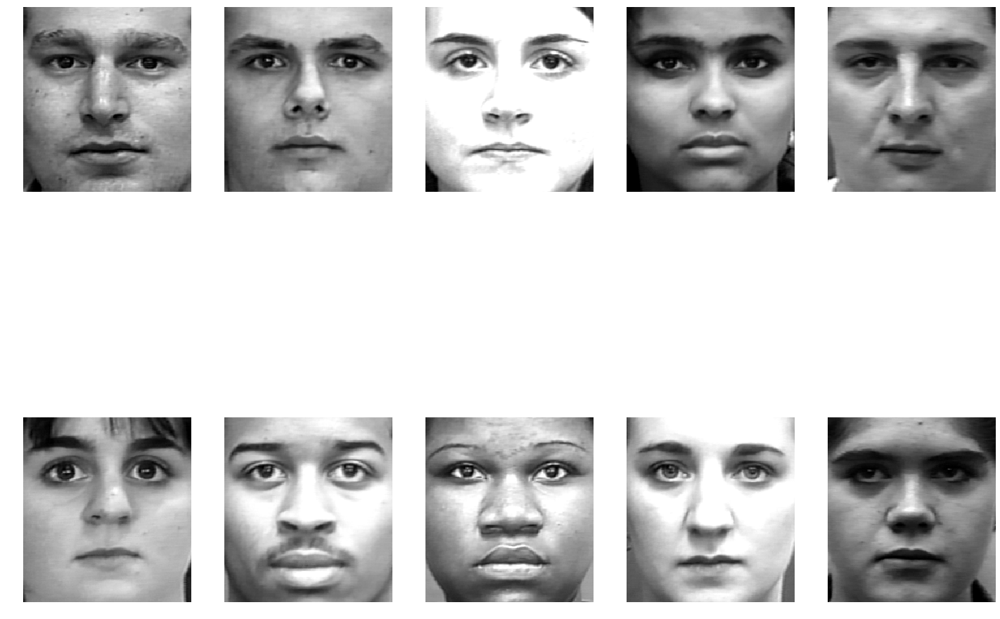

In [40]:
# selecting 10 random images
from random import shuffle
im_matrix = np.zeros((height*width,int(matrix_n.shape[1]/2)))
im_matrix_selected =  np.zeros((height*width,10))
for i in range (int(matrix_n.shape[1]/2)):
    im_matrix[:,i] = matrix_n[:,2*i]

tmp = list(range(0,int(matrix_n.shape[1]/2)))
shuffle(tmp)

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 
for i in range(10):
    im_matrix_selected[:,i] = im_matrix[:,tmp[i]]
    ax[i].imshow(np.reshape(im_matrix_selected[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()


در قسمت های بعد در ابتدا با 10 پایه و سپس 20 پایه تصاویر را در فضای حالت های دیگر میسازیم در انتها راجب به نتایج توضیحاتی خواهیم داد

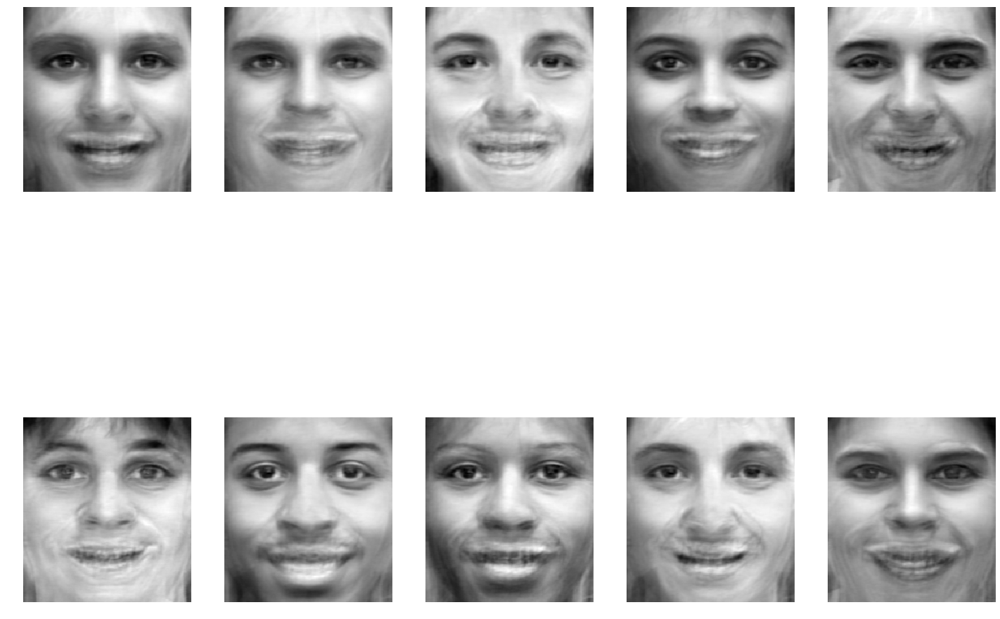

In [41]:
#for happy face

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 

t_f = np.zeros((height*width,10))
for i in range(10):
    arr = im_matrix_selected[:,i]
    arr = arr - m_h
    arr = np.matmul(np.transpose(vecsh),arr)
    arr_final = np.zeros((height*width,))
    for j in range(20):
        arr_final = arr[j]*vecsh[:,j] + arr_final
    t_f[:,i] = arr_final + m_h
    ax[i].imshow(np.reshape(t_f[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

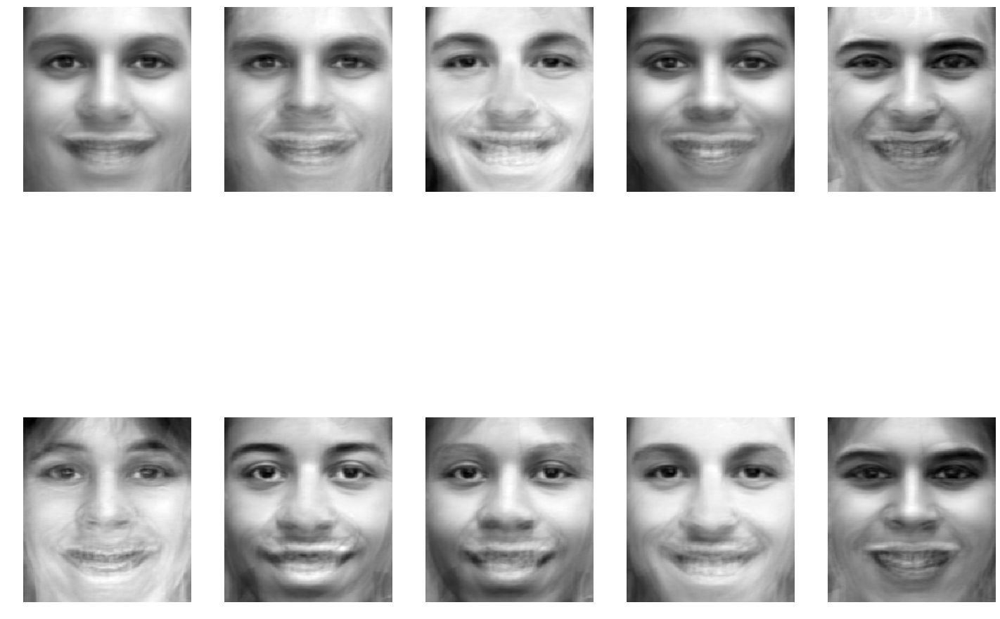

In [42]:
# with only 10 eigen face
#for happy face

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 

t_f = np.zeros((height*width,10))
for i in range(10):
    arr = im_matrix_selected[:,i]
    arr = arr - m_h
    arr = np.matmul(np.transpose(vecsh),arr)
    arr_final = np.zeros((height*width,))
    for j in range(10):
        arr_final = arr[j]*vecsh[:,j] + arr_final
    t_f[:,i] = arr_final + m_h
    ax[i].imshow(np.reshape(t_f[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show() 

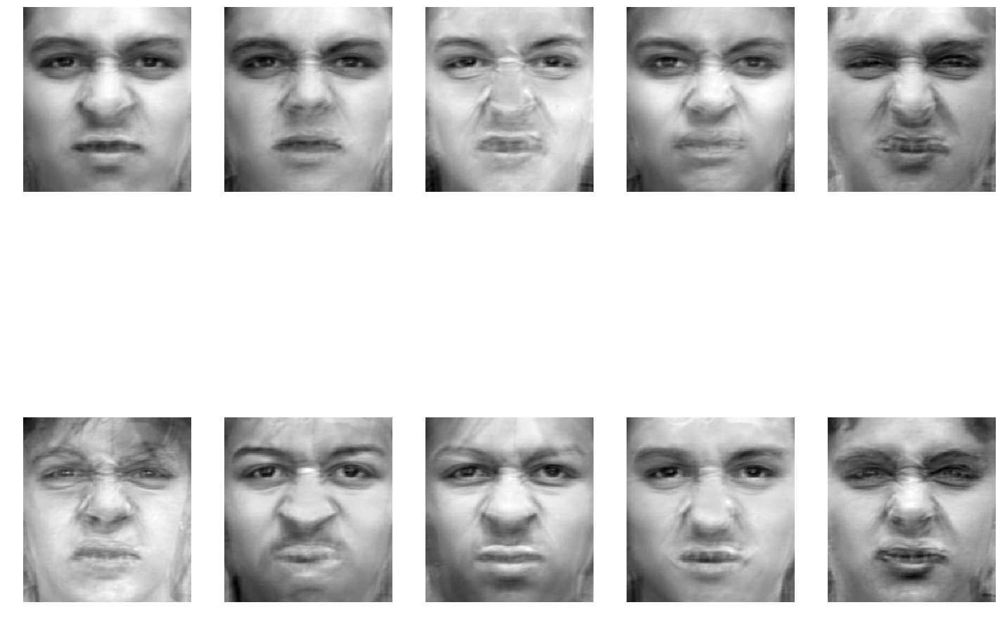

In [43]:
#for disgusset face

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 

t_f = np.zeros((height*width,10))
for i in range(10):
    arr = im_matrix_selected[:,i]
    arr = arr - m_d
    arr = np.matmul(np.transpose(vecsd),arr)
    arr_final = np.zeros((height*width,))
    for j in range(20):
        arr_final = arr[j]*vecsd[:,j] + arr_final
    t_f[:,i] = arr_final + m_d
    ax[i].imshow(np.reshape(t_f[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

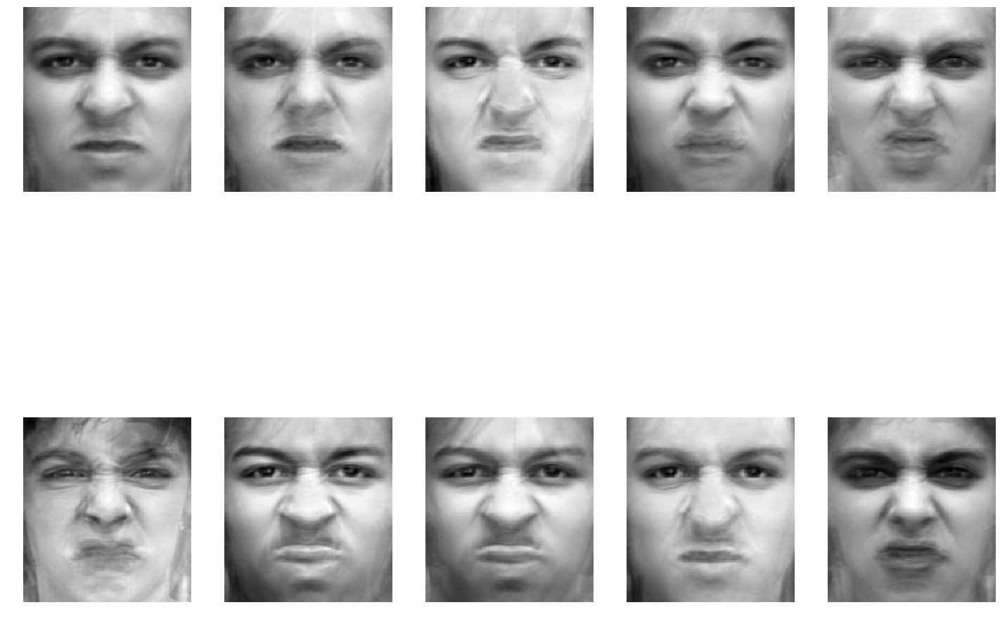

In [44]:
#for disgusset face

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 

t_f = np.zeros((height*width,10))
for i in range(10):
    arr = im_matrix_selected[:,i]
    arr = arr - m_d
    arr = np.matmul(np.transpose(vecsd),arr)
    arr_final = np.zeros((height*width,))
    for j in range(10):
        arr_final = arr[j]*vecsd[:,j] + arr_final
    t_f[:,i] = arr_final + m_d
    ax[i].imshow(np.reshape(t_f[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

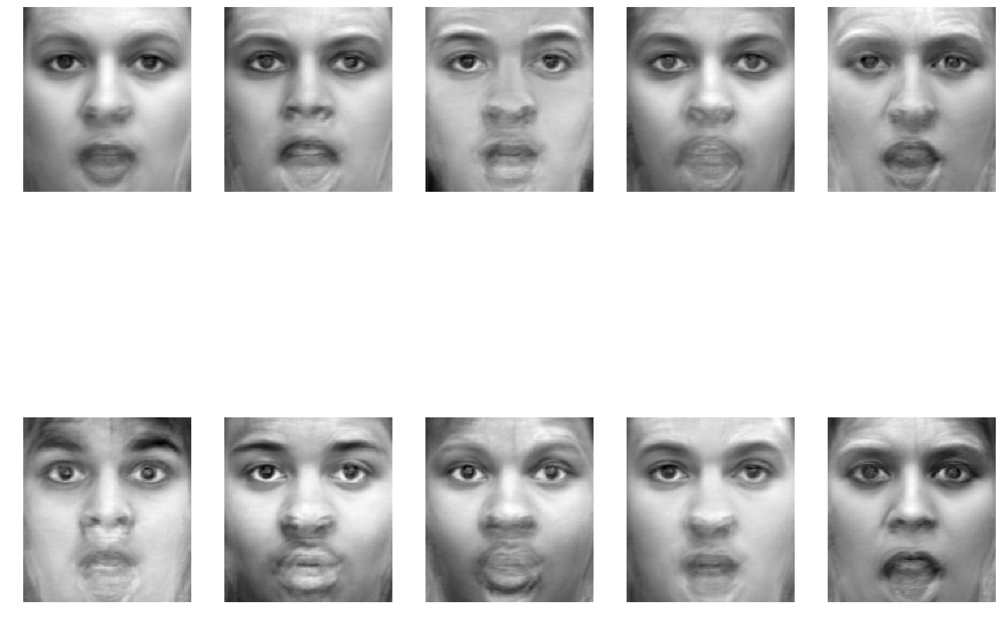

In [45]:
#for surprised face

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 

t_f = np.zeros((height*width,10))
for i in range(10):
    arr = np.matmul(np.transpose(vecss),im_matrix_selected[:,i] - m_s)
    arr_final = np.zeros((height*width,))
    for j in range(20):
        arr_final = arr[j]*vecss[:,j] + arr_final
    t_f[:,i] = arr_final + m_s
    ax[i].imshow(np.reshape(t_f[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()

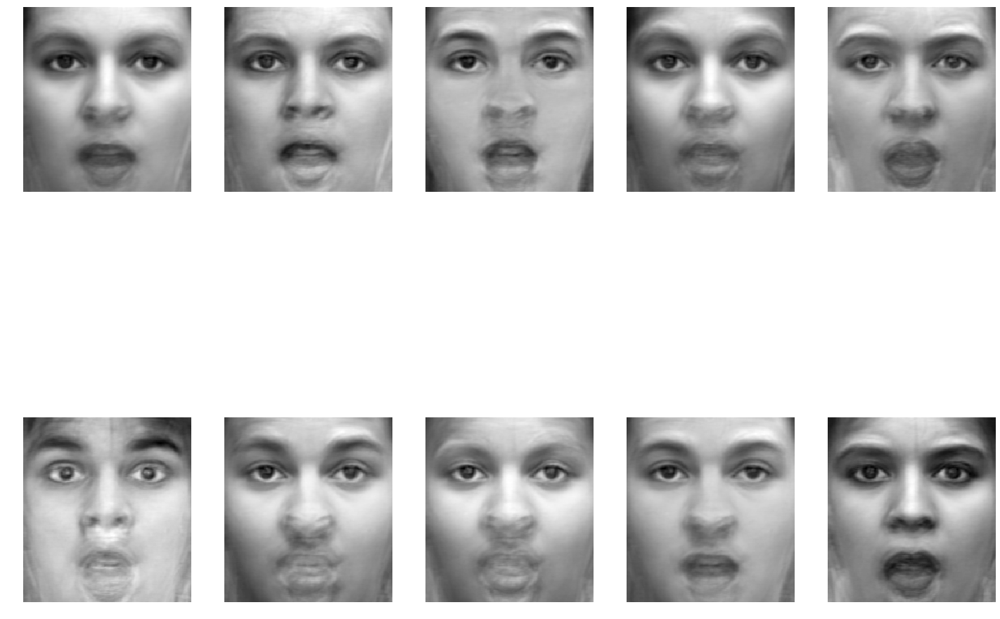

In [46]:
#for surprised face

fig, axes = plt.subplots(2, 5, figsize=(20, 20))
ax = axes.ravel() 

t_f = np.zeros((height*width,10))
for i in range(10):
    arr = np.matmul(np.transpose(vecss),im_matrix_selected[:,i] - m_s)
    arr_final = np.zeros((height*width,))
    for j in range(10):
        arr_final = arr[j]*vecss[:,j] + arr_final
    t_f[:,i] = arr_final + m_s
    ax[i].imshow(np.reshape(t_f[:,i],(height,width)), cmap=plt.cm.gray)
    ax[i].axis('off')
fig.tight_layout()
plt.show()   

همانطور که مشاهده میشود هویت تصاویر نگه داشته میشود( البته با در نظر گرفتن پایه های کم که جزییات را به صورت عالی بازسازی نمیکند) ولی همانگونه که مشاهده میشود حالت انها تغییر کرده است و دقیقا حالتی که در آن فضا بازسازی شده است را بازگو میکند( یعنی اگر با پایه هایی که با صورت خندان ساخته شده است انرا بازسازی کنیم مشاهده میشود که حالت خروجی خندان است و برای بقیه حالات نیز به صورت مشابه میباشد ولی اگر دقت کنید خود فرم چشم( بدون ابرو) به صورت خیلی خوبی باز سازی میشود ولی بقیه موارد چون در حالت تغییر صورت زاویه انها تغییر میکند فرمت انها عوض میشود و یک حالت سایه مانند برای همین امر نیز مشاهده میشود. یک نکته دیگر این میباشد که بنا بر اینکه یک حالت چه قدر میتواند متفاوت باشد خروجی مبهم تر میباشد مثلا چون لبخند افراد به شدت با هم متفاوت است( از منظر اینکه چقدر لب کشیده باشد) مشاهده میشود حالت خنده نسبتا مبهم ساخته میشود ولی سورپرایز شدن انقدر تفاوت ندارد و بهتر است و به همین منوال میتوان در رابطه با بقیه حالات نیز نظر داد